Hypothesis: User sentiment trends negatively for later appVerions

[Link to Dataset on Kaggle](https://www.kaggle.com/datasets/ashishkumarak/tiktok-reviews-daily-updated)

In [3]:
#import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#for sentiment analysis
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
import random

nltk.download('all')

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to /home/repl/nltk_data...
[nltk_data]    |   Unzipping corpora/abc.zip.
[nltk_data]    | Downloading package alpino to /home/repl/nltk_data...
[nltk_data]    |   Unzipping corpora/alpino.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     /home/repl/nltk_data...
[nltk_data]    |   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger_eng to
[nltk_data]    |     /home/repl/nltk_data...
[nltk_data]    |   Unzipping
[nltk_data]    |       taggers/averaged_perceptron_tagger_eng.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     /home/repl/nltk_data...
[nltk_data]    |   Unzipping
[nltk_data]    |       taggers/averaged_perceptron_tagger_ru.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger_rus to
[nltk_data]    |     /home/repl/n

True

## **Data Cleaning**

In [4]:
# Read the CSV files
tiktok_df = pd.read_csv('tiktok_reviews.csv')

# Display the first few rows of the dataframe
tiktok_df

,reviewId,userName,content,score,thumbsUpCount,reviewCreatedVersion,at,appVersion
0,1230c007-f38c-452d-bdcc-f4c11191c6cf,Teboho Phakane,The best,5,0,NaN,2024-08-11 19:23:23,NaN
1,dd1765f3-7ac4-4dda-883e-ceb13778e873,Jawad Khan,Only 1 My video viral palease,5,0,NaN,2024-08-11 19:23:17,NaN
2,9f7894eb-e719-4d5c-92d2-363e039f5fe3,Abdalah Kindamba,Good,5,0,NaN,2024-08-11 19:23:03,NaN
3,dcb1b8f9-a794-4677-9c2d-7f8697169b9b,GHULAM ABBAS,Nice ☺️,5,0,35.7.3,2024-08-11 19:20:19,35.7.3
4,4f541f9f-f705-49e7-82c1-f3d0b197fa8f,turbat balochistan,Good,5,0,35.9.4,2024-08-11 19:19:14,35.9.4
...,...,...,...,...,...,...,...,...
211340,e47cf18d-1462-4f70-9870-700e438509cf,A Google user,This app is amazing! In this we can chat with ...,5,0,NaN,2020-03-23 06:41:37,NaN
211341,7bf1007e-5fb9-4c1e-98a8-bc13472253c6,A Google user,Fantastic app too Social Media as a new creati...,5,0,14.7.1,2020-01-15 23:27:59,14.7.1
211342,84038ec3-8d91-4ed2-90bc-bcd8d3149911,Junaide Esterhuizen,"Tiktok pls add a tikkok message app, your app ...",5,0,NaN,2023-08-31 13:48:23,NaN
211343,e8997806-61de-4881-b918-f3802350a19b,Tomeka Kemp,Just love seeing the amazing talent of the cre...,5,3,22.8.3,2022-01-09 18:42:59,22.8.3


In [5]:
#look at columns
tiktok_df.columns

Index(['reviewId', 'userName', 'content', 'score', 'thumbsUpCount',
       'reviewCreatedVersion', 'at', 'appVersion'],
      dtype='object')

In [6]:
#cleaning. checking for null values
tiktok_df.isna().sum()

reviewId                    0
userName                    0
content                     8
score                       0
thumbsUpCount               0
reviewCreatedVersion    61223
at                          0
appVersion              61223
dtype: int64

In [7]:
#drop na values
tiktok_df = tiktok_df.dropna()
tiktok_df

,reviewId,userName,content,score,thumbsUpCount,reviewCreatedVersion,at,appVersion
3,dcb1b8f9-a794-4677-9c2d-7f8697169b9b,GHULAM ABBAS,Nice ☺️,5,0,35.7.3,2024-08-11 19:20:19,35.7.3
4,4f541f9f-f705-49e7-82c1-f3d0b197fa8f,turbat balochistan,Good,5,0,35.9.4,2024-08-11 19:19:14,35.9.4
6,32af5342-ddc2-46dd-ab65-5a4c2b35f861,Md Osman,sopar,5,0,35.1.3,2024-08-11 19:17:41,35.1.3
8,b208db19-e85f-4e8c-8394-d1e443cfdf0b,Akram ali,❤️,5,0,34.3.3,2024-08-11 19:15:25,34.3.3
9,8c915c49-5caf-4b7e-afb1-a53571801034,A Google user,I loved it because I love singing/😒,5,0,10.4.0,2024-08-11 19:14:26,10.4.0
...,...,...,...,...,...,...,...,...
211336,68a95ba0-a706-4cbb-af87-fd22ddb1b5ff,Ranz and Qatrine,Love the app but now everytime I try opening t...,2,1,31.1.4,2023-09-02 22:17:28,31.1.4
211339,f4092f59-d979-4c9e-a6c2-884d3f1fd168,Kigi,I love the app but my only problem is that it ...,4,2,22.4.3,2022-05-09 13:25:20,22.4.3
211341,7bf1007e-5fb9-4c1e-98a8-bc13472253c6,A Google user,Fantastic app too Social Media as a new creati...,5,0,14.7.1,2020-01-15 23:27:59,14.7.1
211343,e8997806-61de-4881-b918-f3802350a19b,Tomeka Kemp,Just love seeing the amazing talent of the cre...,5,3,22.8.3,2022-01-09 18:42:59,22.8.3


In [8]:
#convert data type of 'appVersion' column to category for ease of ordering
tiktok_df['appVersion'] = tiktok_df['appVersion'].astype('category')


The app versions are too specific, here we take just the integer of the decimal and convert to an integer for ease of analyzing

In [9]:
tiktok_df['appVersion'] = tiktok_df['appVersion'].apply(lambda x: x.split('.')[0])

In [10]:
tiktok_df['appVersion'] = tiktok_df['appVersion'].astype(int)

In [11]:
#check value counts of app version
tiktok_df.value_counts('appVersion').sort_index()

appVersion
0         1
4        65
5        75
6       137
7        77
8       823
9      1606
10      794
11     1031
12     1018
13     1509
14     2727
15     3702
16     2469
17     4309
18     5169
19     2180
20     2868
21     1989
22     2250
23     3395
24     3187
25     3208
26     2681
27     3009
28     2923
29     2984
30     3711
31     3471
32    10250
33    10918
34    25677
35    38871
36       63
99      971
Name: count, dtype: int64

It looks like there's some outliers. Version 35 is the latest version of Tiktok, but there are values for 36 and 99. Since there's not a large number of these values, let's drop them

In [12]:
tiktok_df= tiktok_df[tiktok_df['appVersion']<=35]


In [13]:
#look at created categories
#tiktok_df['appVersion'].cat.categories

In [14]:
#sort dataframe by oldest app version
tiktok_df.sort_values('appVersion')

,reviewId,userName,content,score,thumbsUpCount,reviewCreatedVersion,at,appVersion
202965,16e007d2-7464-4a8b-b59d-10488103262f,Donald Trump,"App will steal your data, which yeah is common...",1,0,0.8.13,2020-07-16 10:06:43,0
210835,a2fdc42d-514d-4230-86b8-048af9663130,A Google user,"Amazing to use in free time, I love dancing an...",5,0,4.15.2,2020-02-06 14:24:40,4
3489,946f0c43-c158-4d3f-b7f0-0ba55354be0b,Δήμητρα Ζαμάγια,It's perfect but since today morning I can't m...,5,2,4.13.2,2024-08-08 19:16:09,4
171860,4e845579-8986-416b-bc86-8a6b557212a4,Manlypineapple1,I would rate this 0 if I could the app is full...,1,0,4.15.2,2020-09-09 23:36:41,4
147200,d4eaea55-6caf-4c88-ae14-1079328bdc09,Kassidy Prodahl,Have an amazing time on this app. Definitely c...,5,0,4.9.0,2021-01-27 06:35:36,4
...,...,...,...,...,...,...,...,...
52422,69ebde74-bc10-4e36-859e-542c5985002a,Jeannette Ross,Sucks,1,0,35.3.4,2024-07-01 19:52:13,35
52421,a80f2544-abbf-4f23-b06d-9b81ed08a0ae,Elifnesh Zeyine,elifnash zeyine,5,0,35.3.4,2024-07-01 19:52:58,35
52420,98e26753-1fa3-436b-ba27-7c08d6a23b90,John Foster,I love this app,5,0,35.3.4,2024-07-01 19:54:55,35
52456,1dbc1208-770b-422e-b809-7b89396a2f9d,Unathi Matukane,Best,5,0,35.3.4,2024-07-01 19:26:01,35


Let's make a wordcloud to see general sentiment before doing an in-depth analysis

In [15]:
def create_wordcloud(data,col):
    # let's extract all text from our dataframe
    allText = list(data[col])

# for wordcloud to work, we need to pass a single string instead of a list
    wordcloudDataRaw = ' '.join(allText)

# generate the cloud
    image = WordCloud(background_color='white').generate(wordcloudDataRaw).to_array()

# show it!
    plt.figure(figsize=(15,8))
    plt.imshow(image, interpolation='nearest')
    plt.axis('off')
    plt.show()
    

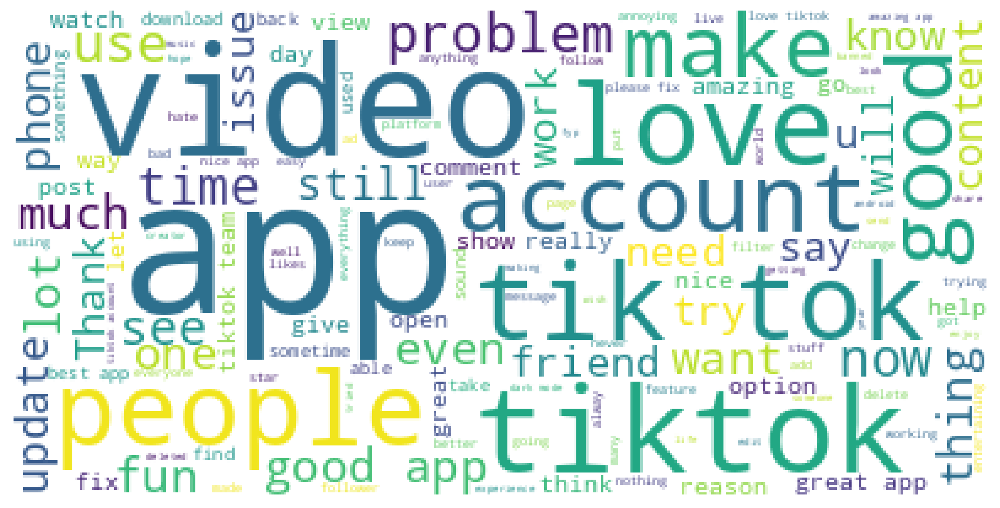

In [16]:
# Create a wordcloud for the original dataframe (tiktok_df)
create_wordcloud(tiktok_df,'content')

It seems the general sentiment is positive

- After data cleaning, we get the dataset prepped for sentiment analysis
- Pre-process the text to prepare for sentiment analysis

In [18]:
# create preprocess_text function
def preprocess_text(text):

    # Tokenize the text (separates words)
    tokens = word_tokenize(text.lower())


    # Remove stop words (words that don't have any positive or negative meaning)
    filtered_tokens = [token for token in tokens if token not in stopwords.words('english')]
    
    # Lemmatize the tokens (takes the root word)
    lemmatizer = WordNetLemmatizer()
    lemmatized_tokens = [lemmatizer.lemmatize(token) for token in filtered_tokens]

    # Join the tokens back into a string
    processed_text = ' '.join(lemmatized_tokens)
    
    return processed_text

In [19]:
#Explain semntiment analysis

In [20]:
#prepare dataframe for pre-processing


#generate a random sample because the dataframe was too large to work with
np.random.seed(1220)
test = tiktok_df.sample(n=10000)
#test = tiktok_df.copy()

#reset index after generating sample
test=test.reset_index(drop=True)

#converting the content column to a string
test['content'] = test['content'].astype(str)

#tiktok_df['content'] = tiktok_df['content'].apply(preprocess_text)
#tiktok_df["content"]
test


,reviewId,userName,content,score,thumbsUpCount,reviewCreatedVersion,at,appVersion
0,6037af5a-47a3-4a06-9cdb-3e7c19bbc7d5,Nikki Johnson,I got reported I did nothing wrong And my acco...,1,0,35.1.3,2024-06-13 21:36:47,35
1,d6a66f53-e685-4007-9859-cadfd01469b4,Whatever Omggirl,It is a good thing that I found this app some ...,5,0,25.3.4,2022-07-25 04:03:31,25
2,50ff7706-115e-438d-b3ec-098220c1104f,Jahidul Islam,Beautiful software,5,0,35.6.3,2024-07-29 14:57:15,35
3,a2be852f-942b-4e8e-86a3-d4496284a025,Arjun Singh,Verry Nice apps.,5,0,35.5.4,2024-07-13 10:45:04,35
4,ca822858-32f5-42f7-b483-630ee60d44ce,Patrina kelly,This app was good until some weeks later every...,1,1,20.0.5,2021-07-06 22:29:18,20
...,...,...,...,...,...,...,...,...
9995,c177cd2d-77db-4b88-980b-f13e3e41af61,Tshwaro Morape,They are muting famous songs I am disappointed...,1,1,33.7.4,2024-03-06 14:02:24,33
9996,0e894c66-e935-4bb6-8a8e-4d93970f64b2,K Wilson,It just won't let me log in. I've tried all th...,1,0,34.8.4,2024-05-18 19:44:50,34
9997,927a5e18-228d-41e8-badd-6703db4f1381,noyb。999,"First time rating TikTok, why I can't reply wi...",1,0,35.6.3,2024-07-15 19:01:47,35
9998,2658cd71-2915-4e82-8111-17e892cb2cb9,A Google user,I have been making tiktok videos for a while n...,5,1,15.2.3,2020-03-11 21:23:09,15


In [21]:
#applying the pre-process steps of sentiment analysis to the new dataframe
test['content'] = test['content'].apply(preprocess_text)
test['content'].dtype

dtype('O')

Add a function to analyze the sentiments on the content of the reviews:

In [22]:
#sentiment analysis function
from nltk.sentiment.vader import SentimentIntensityAnalyzer
sid = SentimentIntensityAnalyzer()
def create_sentiments(data, col, score):
    from nltk.sentiment.vader import SentimentIntensityAnalyzer
    sid = SentimentIntensityAnalyzer()
    data['sentiments'] = data[col].apply(lambda x: sid.polarity_scores(x)[score])
    #test['sentiments'] = test['content'].apply(lambda x: sid.polarity_scores(x)['compound'])
    #test.sort_values('score')

Functions to create graphs:

In [23]:
def create_barplot(data, x, y):
    sns.barplot(data=data, x=x,y=y)
    plt.xticks(rotation=90)
    plt.show()

In [24]:
def create_countplot(data, x):
    sns.countplot(data=data, x=x)
    plt.xticks(rotation=90)
    plt.show()

In [25]:
def create_lineplot(data,x,y):
    sns.lineplot(data=data,x=x,y=y)
    plt.xticks(rotation=90)
    plt.show()

In [26]:
def create_boxplot(data,x,y):
    plt.figure(figsize=(15,8))
    sns.boxplot(data=data,x=x,y=y)
    plt.xticks(rotation=90)
    plt.show()

In [27]:
#create a 'sentiments' column
create_sentiments(test,'content', 'compound')

In [47]:
#look at sentiments by app version
test.sort_values('appVersion')

,reviewId,userName,content,score,thumbsUpCount,reviewCreatedVersion,at,appVersion,sentiments
6634,16e007d2-7464-4a8b-b59d-10488103262f,Donald Trump,"app steal data , yeah common , much data go co...",1,0,0.8.13,2020-07-16 10:06:43,0,-0.2500
380,3696cfb8-9a74-40e9-96c9-2fc1d9b8b952,Autumn Mauer,"lost one account autumnm2003 . awhile back , f...",1,0,4.13.6,2020-10-12 21:01:49,4,0.4696
3026,22d15444-11b8-40e9-97ff-6797e2689651,A Google user,app pop corner screen every 10 minute . n't qu...,1,0,4.7.0,2018-12-04 22:17:49,4,-0.5574
1057,a7052f6b-8b08-4b57-b0b8-8de47d8842fe,A Google user,tik tok best many thing many thing learn lovel...,5,0,4.15.2,2020-01-18 22:32:35,4,0.9440
2055,fd8d8d0b-c202-4c23-89d5-55e21f012e66,Iya Calumpiano,wowie ! app cool .... already downloaded say d...,5,0,4.15.2,2020-12-14 05:36:19,4,0.8715
...,...,...,...,...,...,...,...,...,...
9110,2a3ebae1-1730-4a48-915a-6e31afc64d48,Md Anwar Md Anwar Hossain,nice two meet,4,0,35.9.4,2024-08-07 14:11:00,35,0.4215
985,e661d22b-a958-4963-b6bb-d8428c213ac8,Christopher Norgaard,entertainment sure,4,0,35.6.3,2024-07-18 06:06:25,35,0.6249
1020,1451a6a3-f1eb-4206-8f43-f3bce9a755d4,Rezaulkarim Rezaulkarim,rajoan,5,0,35.4.4,2024-07-10 18:39:32,35,0.0000
9142,4609d4ea-fe18-4d88-9cc0-470f0ee51009,Ali Meyo,ok✨✨✨,1,0,35.0.4,2024-06-13 14:07:46,35,0.0000


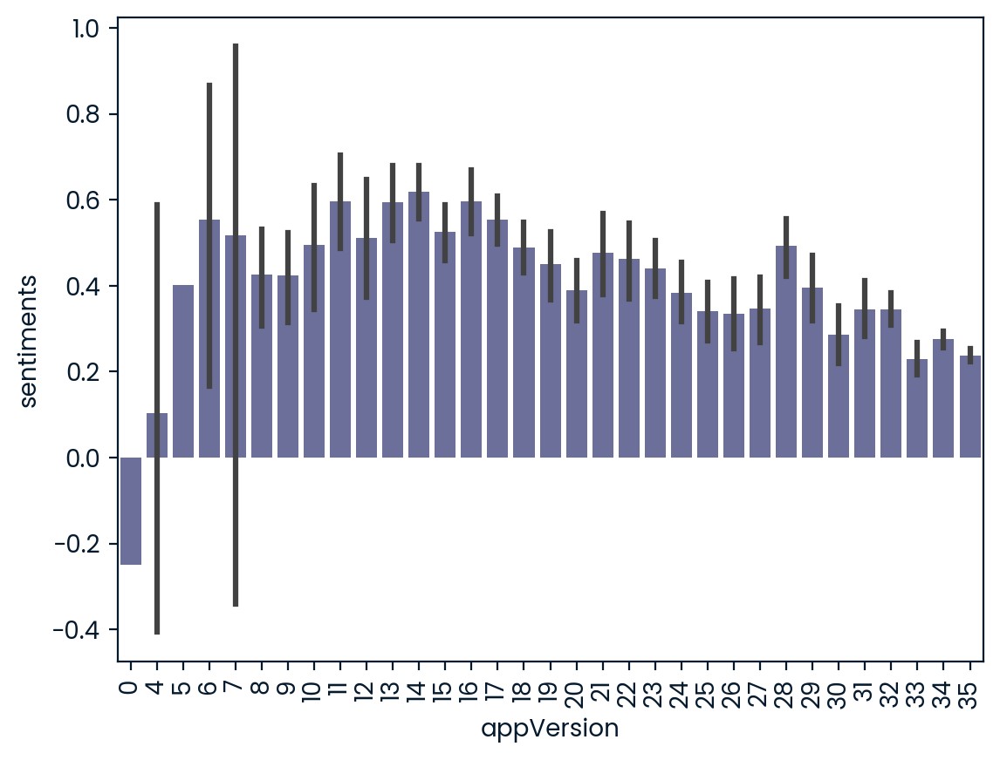

In [28]:
create_barplot(test,'appVersion','sentiments')

This graph has almost no negative numbers, which doesn't seem accurate to the sentiments. Let's try a different graph.

In [30]:
#normalize data
test_mean=test.groupby('appVersion')['sentiments'].agg('mean').reset_index()
test_mean

,appVersion,sentiments
0,0,-0.250000
1,4,0.103957
2,5,0.401900
3,6,0.554414
4,7,0.517867
5,8,0.425468
6,9,0.424115
7,10,0.495888
8,11,0.597493
9,12,0.512033


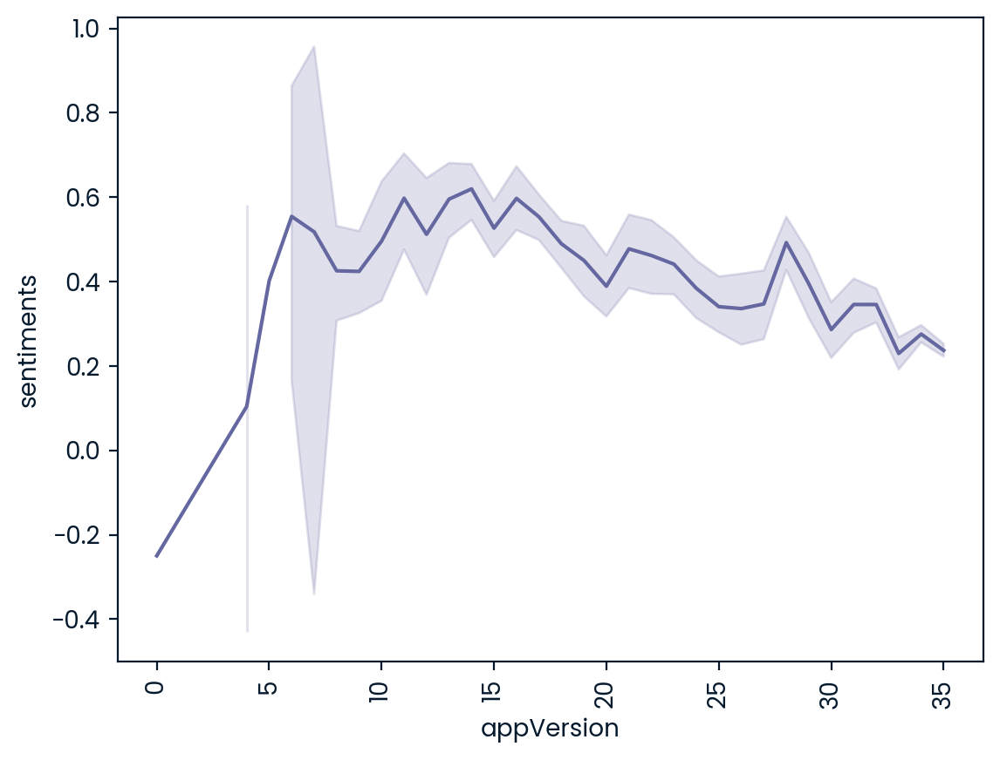

In [31]:
#convert app version to int and sort values for graphing purposes

test = test.sort_values('appVersion')
test['sentiments']

#plot
create_lineplot(test, 'appVersion', 'sentiments')


This graph also doesn't have many negative numbers, what about a box plot?

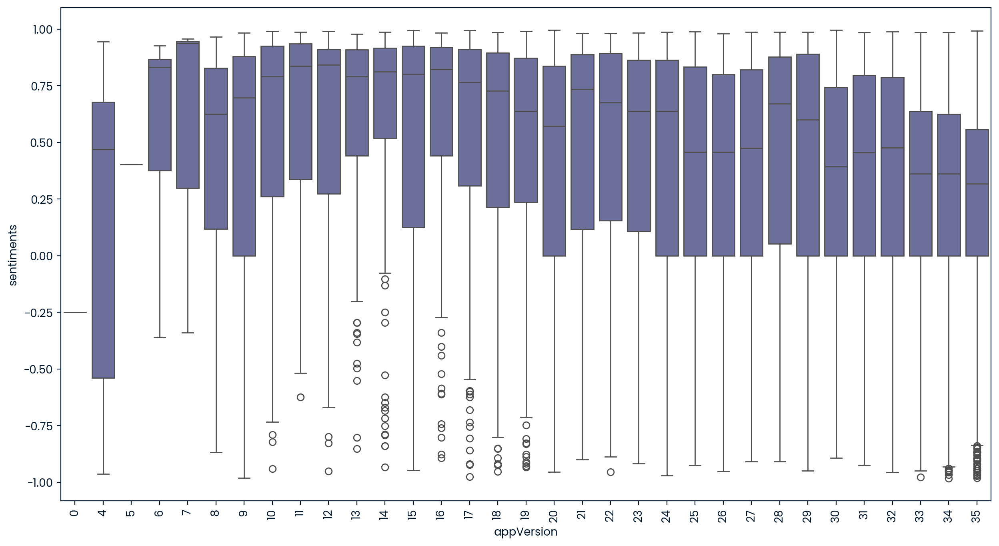

In [32]:
create_boxplot(test,'appVersion','sentiments')

- This graph has both min and max numbers, and is more accurate to the observations made looking at the dataframe.
- Look at counts for reviews regarding app versions

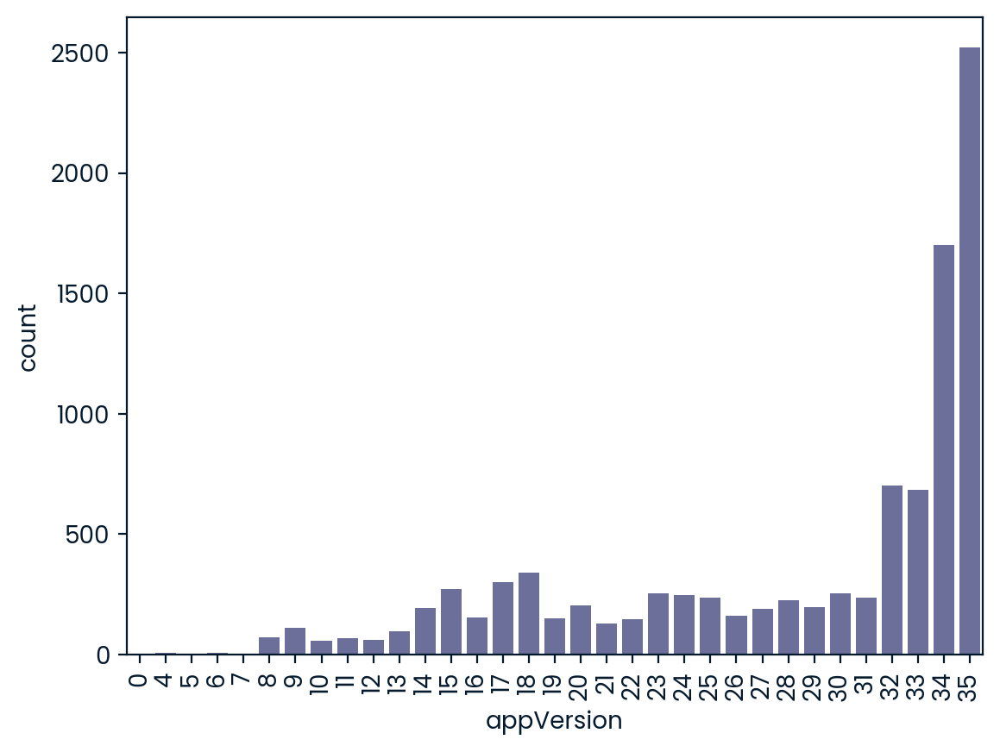

In [33]:
create_countplot(test,'appVersion')

In [34]:
#check values of app version
test['appVersion'].value_counts().sort_index()

appVersion
0        1
4        7
5        1
6        7
7        3
8       73
9      112
10      59
11      68
12      61
13      97
14     194
15     271
16     155
17     300
18     339
19     149
20     206
21     131
22     148
23     256
24     249
25     238
26     161
27     191
28     225
29     197
30     253
31     237
32     702
33     686
34    1701
35    2522
Name: count, dtype: int64

In [35]:
test

,reviewId,userName,content,score,thumbsUpCount,reviewCreatedVersion,at,appVersion,sentiments
6634,16e007d2-7464-4a8b-b59d-10488103262f,Donald Trump,"app steal data , yeah common , much data go co...",1,0,0.8.13,2020-07-16 10:06:43,0,-0.2500
380,3696cfb8-9a74-40e9-96c9-2fc1d9b8b952,Autumn Mauer,"lost one account autumnm2003 . awhile back , f...",1,0,4.13.6,2020-10-12 21:01:49,4,0.4696
3026,22d15444-11b8-40e9-97ff-6797e2689651,A Google user,app pop corner screen every 10 minute . n't qu...,1,0,4.7.0,2018-12-04 22:17:49,4,-0.5574
1057,a7052f6b-8b08-4b57-b0b8-8de47d8842fe,A Google user,tik tok best many thing many thing learn lovel...,5,0,4.15.2,2020-01-18 22:32:35,4,0.9440
2055,fd8d8d0b-c202-4c23-89d5-55e21f012e66,Iya Calumpiano,wowie ! app cool .... already downloaded say d...,5,0,4.15.2,2020-12-14 05:36:19,4,0.8715
...,...,...,...,...,...,...,...,...,...
3058,a2258c02-1645-4da8-b7bf-3e5e5c41d576,Julia. Sánchez López,addictive reason give anxiety sensation intens...,4,0,35.1.3,2024-06-19 03:20:28,35,-0.5574
3054,2267c10b-5ea0-4b8c-84bc-07b86cea2ee5,Endinako Ludzebe,like making happy,5,0,35.3.4,2024-06-29 05:50:20,35,0.7351
3050,45562618-cd2b-470a-ba8c-a1f702c1d0be,Max 999,help,5,0,35.1.3,2024-07-11 14:46:34,35,0.4019
3090,d65d9e74-7b84-430c-9196-a26838095b1a,Boglul Hoq,md.lisan 07,5,0,35.4.4,2024-07-05 15:45:36,35,0.0000


Preliminary Conclusion:
- The sentiment for Tiktok gets closer to neutral-positive the longer the app is out. 
- _**Something to consider:**_
- The amount of reviews for each app version. The newer the app was, the less reviews, and the longer the app was out the more reviews. When Tiktok was still fairly new, the reviews went more positive, and when it had been out for a longer period of time, the reviews started to even out with more data being given.

**Let's perform a weighted sample on this data to help the disporportionate amount of reviews for versions 32 and up to see if the amount of people reviewing the app affected the downward trend of the sentiments.**

In [39]:
#Getting the new dataframe with the weighted samples

# Copy and filter the DataFrame for appVersions greater than 7
tiktok_df_top = tiktok_df.copy()
tiktok_df_top = tiktok_df_top[tiktok_df_top['appVersion'] > 7]

# Calculate the proportion of each appVersion
version_counts = tiktok_df_top['appVersion'].value_counts(normalize=True)

# Assign weights inversely proportional to their occurrence (more common versions get lower weights)
tiktok_df_top['weight'] = tiktok_df_top['appVersion'].apply(lambda x: 1 / version_counts[x])

# Determine the number of samples to take (e.g., 5000 total)
total_samples = 5000

# Perform proportional sampling based on the calculated weights
tiktok_df_weighted_sample = tiktok_df_top.sample(n=total_samples, weights='weight', random_state=1, replace=False)

# Optional: Reset index if needed
tiktok_df_weighted_sample.reset_index(drop=True, inplace=True)

# Print the resulting sample distribution
print(tiktok_df_weighted_sample['appVersion'].value_counts(normalize=True))


appVersion
30    0.0436
33    0.0416
17    0.0404
31    0.0394
10    0.0392
20    0.0378
9     0.0378
32    0.0372
27    0.0370
26    0.0364
35    0.0362
21    0.0362
18    0.0358
25    0.0358
28    0.0352
29    0.0352
16    0.0344
13    0.0340
24    0.0340
34    0.0338
14    0.0338
8     0.0332
15    0.0330
12    0.0328
22    0.0320
19    0.0320
11    0.0316
23    0.0306
Name: proportion, dtype: float64


In [40]:
##Check that the weighteed sample worked
tiktok_df_weighted_sample.value_counts('appVersion').sort_index()

appVersion
8     166
9     189
10    196
11    158
12    164
13    170
14    169
15    165
16    172
17    202
18    179
19    160
20    189
21    181
22    160
23    153
24    170
25    179
26    182
27    185
28    176
29    176
30    218
31    197
32    186
33    208
34    169
35    181
Name: count, dtype: int64

Perform the same analysis that was done on the non-weighted sample to see how the proportion of users affected the final analysis

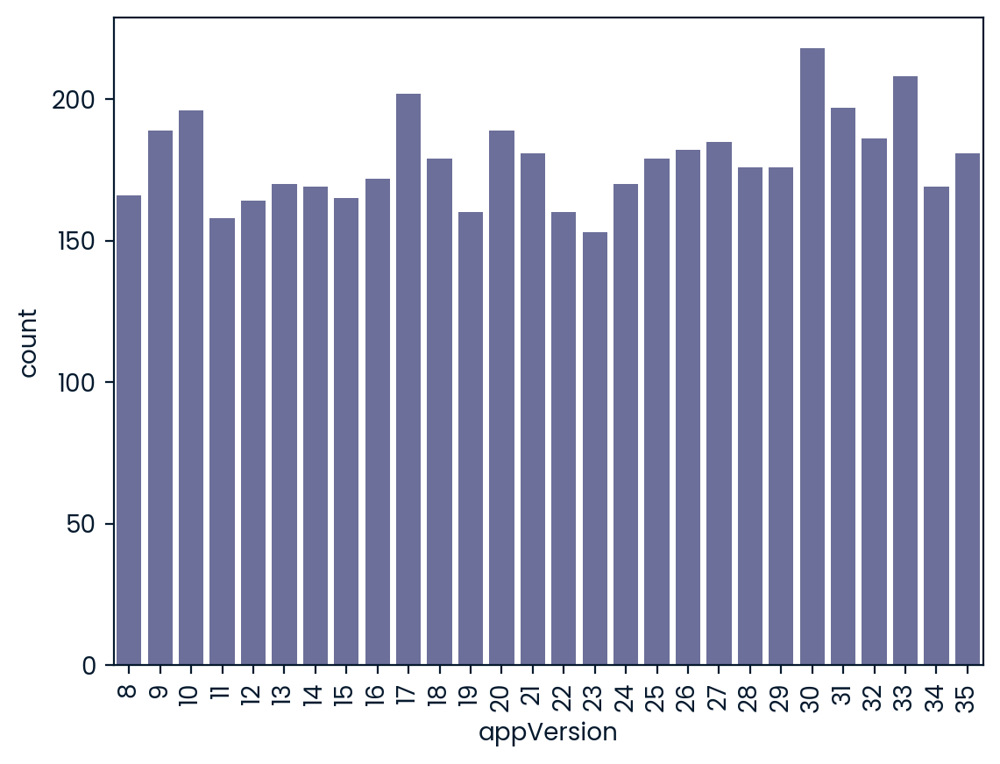

In [41]:
create_countplot(tiktok_df_weighted_sample,'appVersion')

**The weighted sample has a more even distrubtion of counts per app version**

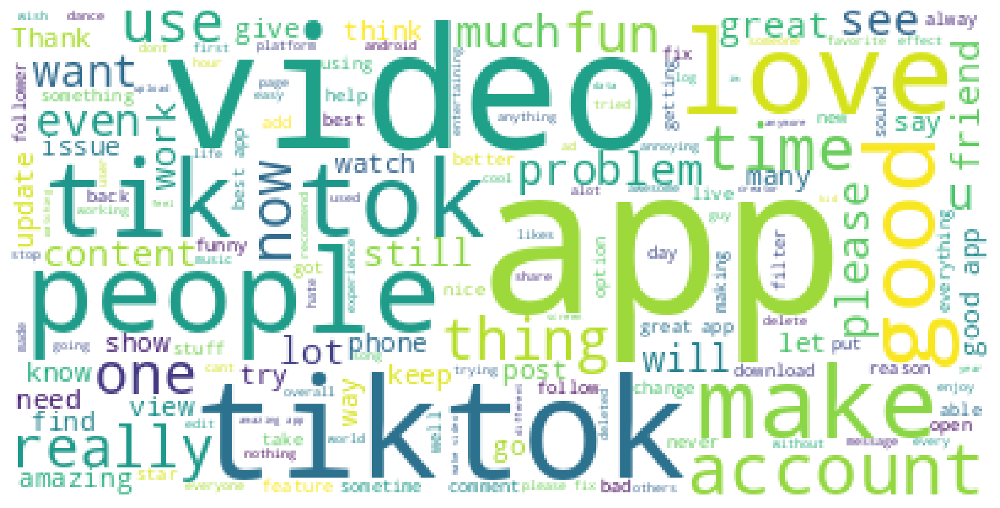

In [42]:
#Create a wordcloud for the weighted sample df
create_wordcloud(tiktok_df_weighted_sample, 'content')

While the size of the words are different, the sentiment seems to lean more positive, just as it did in the original, non-weighted dataframe

In [43]:
#perform a sentiment analysis on the weighted dataframe reviews
create_sentiments(tiktok_df_weighted_sample, 'content', 'compound')
tiktok_df_weighted_sample

,reviewId,userName,content,score,thumbsUpCount,reviewCreatedVersion,at,appVersion,weight,sentiments
0,e5fc9de3-018e-4a5b-a74b-ced92578cced,A Google user,I have been on it since I was in 3rd grade and...,5,101,11.7.4,2019-06-16 03:48:34,11,144.257032,0.9792
1,675b37d5-1d10-4ace-a03a-6e4bc37233b3,Kiara Roos,"This app is absolutely amazing, assuming it's ...",5,0,19.9.4,2022-03-10 18:19:47,19,68.224312,0.8536
2,9dda577f-3e5d-4f9a-8f16-8321f3fec054,Swiss Glizzy (SwissGlizzy),They mess with who can see what comments. That...,1,0,35.7.3,2024-08-11 18:03:41,35,3.826220,-0.8126
3,cd0bcca3-c909-4c9b-8fb3-16b67b114a75,Theresa Fulton,The videos would constantly freeze in the midd...,2,49,16.6.4,2020-07-03 14:32:07,16,60.238558,-0.4754
4,5ef93de4-c52e-43df-9368-b49753b6479a,A delicate Gem,the text to voice is a fail. made a video and ...,1,4,33.8.5,2024-03-23 18:25:23,33,13.622367,-0.5423
...,...,...,...,...,...,...,...,...,...,...
4995,88d5444d-e084-4dbe-8bfb-71e667659024,Christine Sanders,Lately my tik tok videos are lagging after rec...,3,0,26.1.3,2022-09-18 22:02:37,26,55.475196,-0.0900
4996,206a9b07-00f3-4a31-9eca-f4ea9414abc6,MAJID SOOMRO,"Nice, It should be changed in to a more smooth...",5,3,27.5.4,2022-12-29 21:10:25,27,49.428049,0.4753
4997,60f525c2-dc14-4a49-97b8-35d453ad7de6,Why So Geeky?,Honestly pretty okay app. Has helped me grow c...,2,4,19.7.4,2021-06-03 18:29:06,19,68.224312,0.3612
4998,aba89ee1-94c5-4b64-8dd0-6e9ffd784744,Benjamin Macias,This app intertains me and is sometimes funny....,5,0,28.9.4,2023-04-06 05:28:18,28,50.882313,-0.1326


**Perform more in-depth analysis with plots**

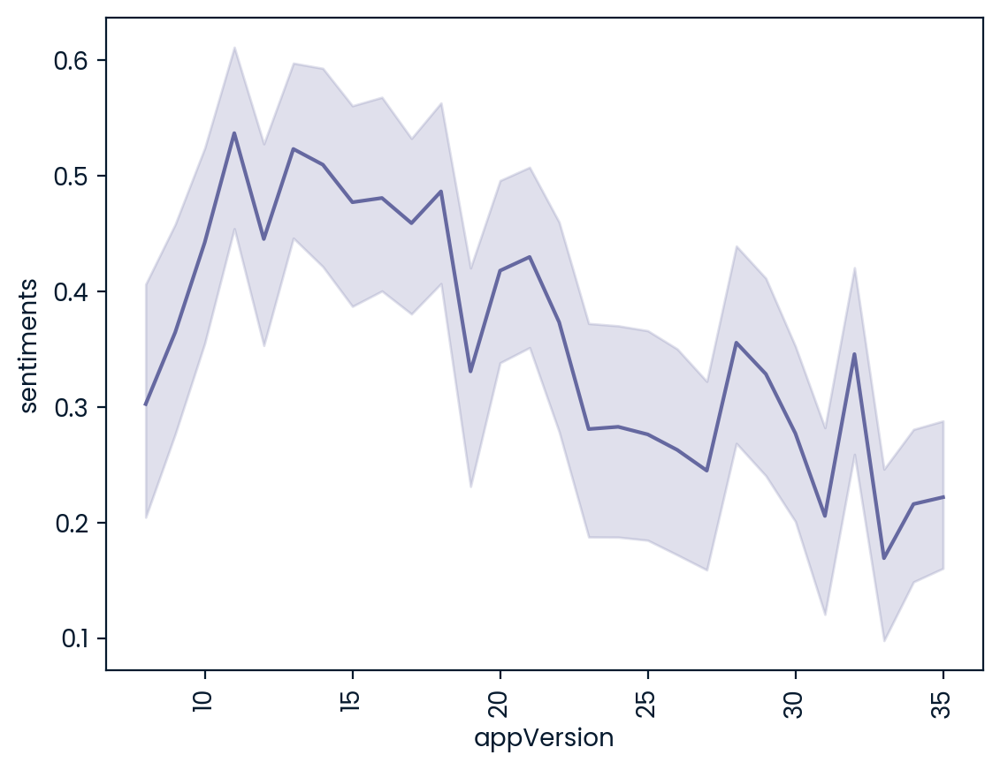

In [44]:
create_lineplot(tiktok_df_weighted_sample,'appVersion','sentiments')

- With this line plot, as opposed to the non-weighted sample, there are a lot more variations.
- However, the data trends toward the neutral rating the newer the version is. This lets us know that it has less to do with amount of people reviewing the app.
- This completely disproves our orignial observations

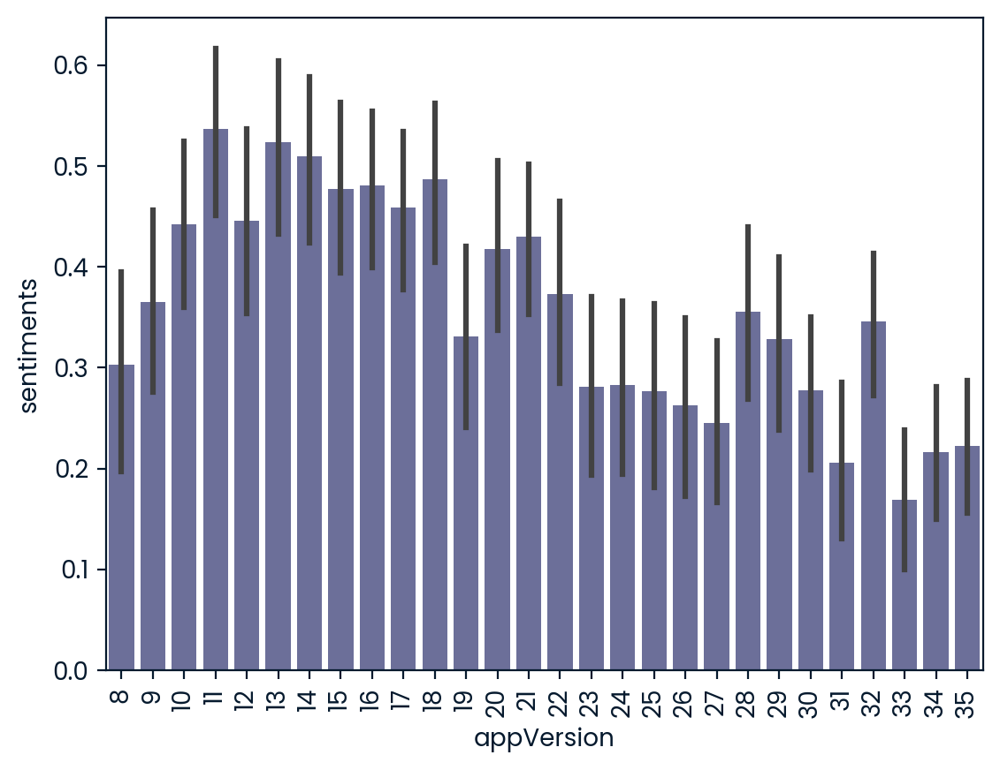

In [45]:
create_barplot(tiktok_df_weighted_sample,'appVersion','sentiments')

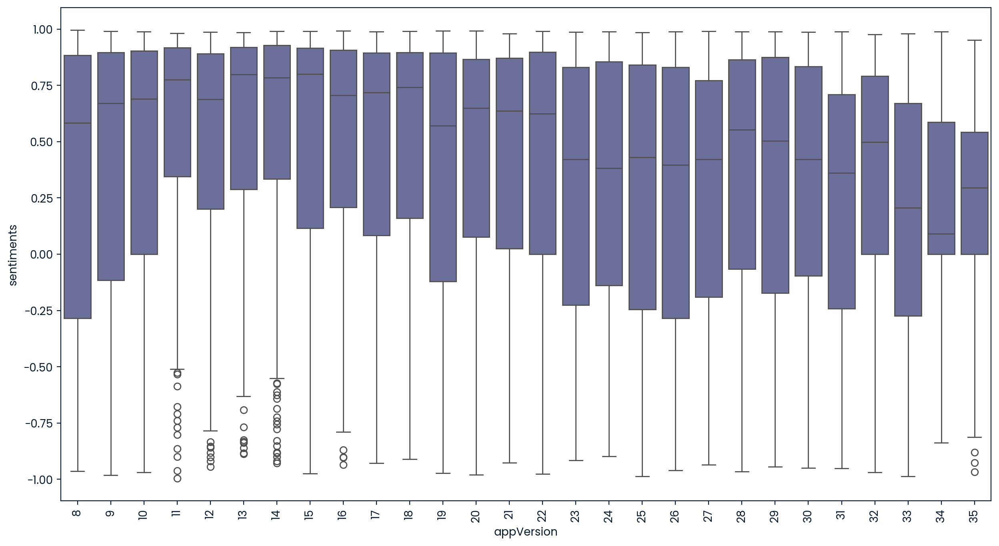

In [46]:
create_boxplot(tiktok_df_weighted_sample,'appVersion','sentiments')

## - **The sentimenet of the app seems to be generally the same regardless of the even weight distribution. Are there outside factors that could affect the downwards sentiment of the app?**
## - **Here we look at news articles and other world-events going on during the times of these releases.**

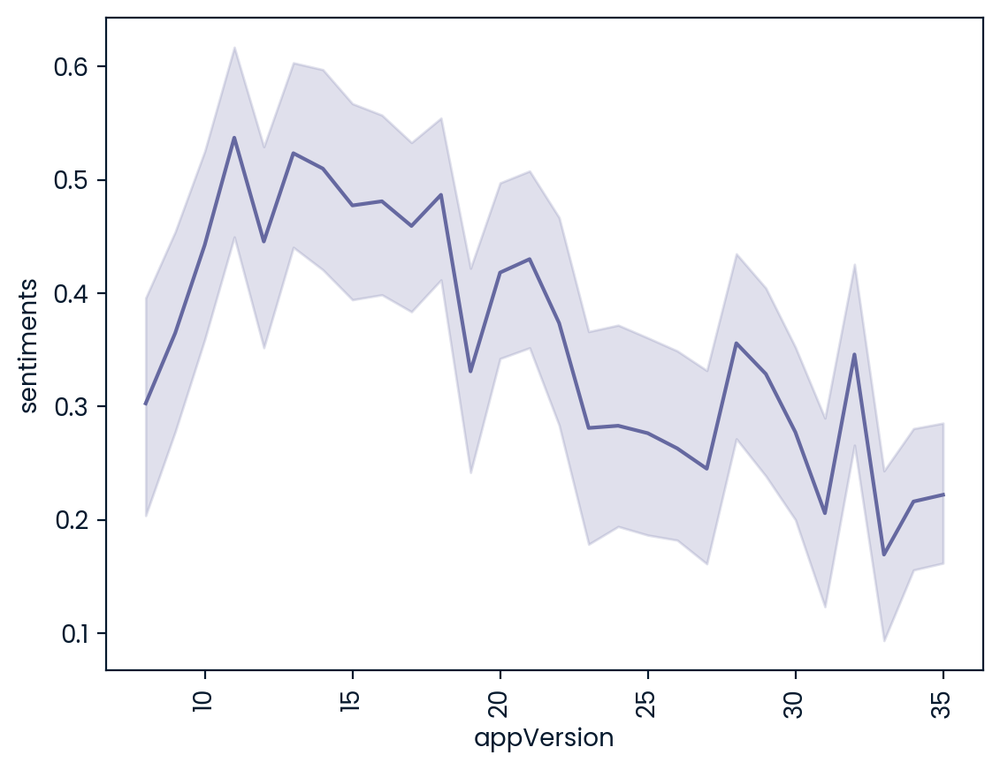

In [48]:
#Bring back the line plot to see the variations in sentiment
create_lineplot(tiktok_df_weighted_sample, 'appVersion','sentiments')

![Screenshot 2024-08-14 at 1.00.47 PM](screenshot1.png)

-  Up to version 10 of the app, we see the graph(sentiment) increasing. We believe this is because new apps generate a lot of positive sentiment unless something is incredibly wrong. The graph also starts closer to neutral, so it doesn't take much for it to go up.
-  After version 10, we see a smaller decline before staying relatively uniform until version 16. This is when tiktok officially took on the name Tiktok and grew globally. We believe the sharp decrease in sentiment is due to being opening gloablly, and the app having to adjust for different viewpoints outside of where it originally started. 


![Screenshot 2024-08-14 at 1.02.00 PM](screenshot2.png)

- Version 16 and 17 is around the time the Tiktok executive was under scrutiny and in court in the United States. The 'Tiktok Ban'. We can see this represented by the user sentiment going drastically down.
- Version 18-20 included improved algothrim recommendations, which we believe is the reason for the increase in sentiment.

![Screenshot 2024-08-15 at 9.52.07 AM](screenshot4.png)

- For version 21-25, 
- For versions 26-30, we see a downward trend. During this time, Tiktok expanded globally. We saw this same trend when Tiktok had its first expansion. It takes time for the app to adjust itself to a new audience.
- While there's nothing that can be a big indicator in the trends for versions 31 onwards with the given data, [this link](https://apnews.com/article/tiktok-timeline-ban-biden-india-d3219a32de913f8083612e71ecf1f428) has other information that can explain the graph more in-depth.


In [58]:
content = tiktok_df_weighted_sample[tiktok_df_weighted_sample['appVersion'] > 21]
content = content[content['sentiments'] < 0]
content['content']

2       They mess with who can see what comments. That...
4       the text to voice is a fail. made a video and ...
5               This app is not my videos foryou fail app
8       What is the point of an app that bases itself ...
11      My tik tok is not playing videos although othe...
                              ...                        
4976    This is not connecting with capcut. If I apdat...
4980    Would rate 0 stars if I could. Horrible, I don...
4988    Now after 2 years of barely making TikToks I f...
4995    Lately my tik tok videos are lagging after rec...
4998    This app intertains me and is sometimes funny....
Name: content, Length: 672, dtype: object